In [1]:
%load_ext autoreload
%autoreload 2

INITIAL_Q = 0.5

# Load Data

In [2]:
from spyglass.decoding.v1.waveform_features import UnitWaveformFeatures

# times_list, marks_list = (
#     UnitWaveformFeatures()
#     & {"features_param_name": "amplitude_probe"}
#     & "analysis_file_name LIKE 'wilbur20210404%'"
# ).fetch_data()

[2025-12-18 15:27:29,141][INFO]: Connecting sambray@lmf-db.cin.ucsf.edu:3306
[2025-12-18 15:27:29,171][INFO]: Connected sambray@lmf-db.cin.ucsf.edu:3306


In [4]:
import os

os.chdir("/home/xulu/code/alison_spyglass")
from alison_behav import *


import datajoint as dj
from spyglass.utils.dj_helper_fn import fetch_nwb
from spyglass.common import AnalysisNwbfile

behavior_model_table = dj.FreeTable(
    dj.conn(), "`alison_rlmodel`.`__behavior_model_results__by_day`"
)

subject = "wilbur"
date = "20210404"
file_name = subject + date
nwb_file_name = file_name + "_.nwb"
behavior_model_params_name = "default_hmm"
trials_info_by_rat_params_name = "decay_default"  # For some animals or sessions it could be 'decay_default2' where Alison reran the HMM
behav_results = behavior_model_table & {
    "nwb_file_name": nwb_file_name,
    "behavior_model_params_name": behavior_model_params_name,
    "trials_info_by_rat_params_name": trials_info_by_rat_params_name,
}
# all_behav = behav_results.fetch1_dataframe()
all_behav = fetch_nwb(behav_results, (AnalysisNwbfile, "analysis_file_abs_path"))[0][
    "behavior_model_results_by_day"
]
all_behav

behav_results
script_table = StateScriptTrials() & {"nwb_file_name": nwb_file_name}
trials = []
epoch = []
t_poke = []
t_out = []
for epoch_i in script_table.fetch("epoch"):
    table = script_table & {"epoch": epoch_i}
    trials.extend(table.fetch1("trial"))
    epoch.extend([epoch_i] * len(table.fetch1("trial")))
    t_poke.extend(table.fetch1("poke_in_ts"))
    t_out.extend(table.fetch1("poke_out_ts"))
script_df = pd.DataFrame(
    {"epoch": epoch, "trial_number_by_epoch": trials, "t_poke": t_poke, "t_out": t_out},
)
script_df

##
trial_df = pd.merge(all_behav, script_df, on=["epoch", "trial_number_by_epoch"])
turn_lookup = {
    (1, 2): "right",
    (2, 1): "left",
    (3, 4): "right",
    (4, 3): "left",
    (5, 6): "right",
    (6, 5): "left",
}

fill_entries = [
    (1, "left", [3, 4, 5, 6]),
    (2, "right", [3, 4, 5, 6]),
    (3, "left", [1, 2, 5, 6]),
    (4, "right", [1, 2, 5, 6]),
    (5, "left", [1, 2, 3, 4]),
    (6, "right", [1, 2, 3, 4]),
]
for fill_entry in fill_entries:
    port, turn, other_ports = fill_entry
    for other_port in other_ports:
        turn_lookup[(port, other_port)] = turn

turns = []
for epoch in trial_df["epoch"].unique():
    epoch_df = trial_df[trial_df["epoch"] == epoch]
    turns.append("start")
    for i in range(1, len(epoch_df)):
        turn = turn_lookup[(epoch_df["leaf"].values[i - 1], epoch_df["leaf"].values[i])]
        turns.append(turn)
if "turns" not in trial_df.columns:
    trial_df["turns"] = turns


prev_trial_reward = []
for epoch in trial_df["epoch"].unique():
    epoch_df = trial_df[trial_df["epoch"] == epoch]
    prev_trial_reward.append(np.nan)
    prev_trial_reward.extend(epoch_df["reward"].values[:-1].tolist())
if "prev_trial_reward" not in trial_df.columns:
    trial_df["prev_trial_reward"] = prev_trial_reward

run_starts = []
for epoch in trial_df["epoch"].unique():
    epoch_df = trial_df[trial_df["epoch"] == epoch]
    run_starts.append(np.nan)
    run_starts.extend(epoch_df["t_out"].values[:-1].tolist())
if "run_start" not in trial_df.columns:
    trial_df["run_start"] = run_starts


from spyglass.common import Nwbfile
from pynwb import NWBHDF5IO
from spyglass.utils.nwb_helper_fn import get_nwb_file
from spyglass.utils.dj_helper_fn import _get_nwb_object
from spyglass.common import DIOEvents, Nwbfile, interval_list_intersect
import numpy as np

file_path = Nwbfile().get_abs_path("wilbur20210404_.nwb")
nwb = get_nwb_file(file_path)
dio_query = (
    DIOEvents()
    & {"nwb_file_name": "wilbur20210404_.nwb"}
    & "dio_event_name LIKE 'pump%'"
)

pump_obj_ids = dio_query.fetch("dio_object_id")
all_pump_intervals = []
for obj_id in pump_obj_ids:
    obj = _get_nwb_object(nwb.objects, obj_id)
    state = obj.data[:]
    state_time = obj.timestamps[:]
    ind_on = np.where(state == 1)[0]
    pump_intervals = [
        [st, en] for st, en in zip(state_time[ind_on], state_time[ind_on + 1])
    ]
    all_pump_intervals.extend(pump_intervals)
all_pump_intervals = np.array(all_pump_intervals)
ind = np.argsort(all_pump_intervals[:, 0])
all_pump_intervals = all_pump_intervals[ind]

dio_query = (
    DIOEvents()
    & {"nwb_file_name": "wilbur20210404_.nwb"}
    & "dio_event_name LIKE 'poke%'"
)
poke_obj_ids = dio_query.fetch("dio_object_id")
all_poke_intervals = []
for obj_id in poke_obj_ids:
    obj = _get_nwb_object(nwb.objects, obj_id)
    state = obj.data[:]
    state_time = obj.timestamps[:]
    ind_on = np.where(state == 1)[0]
    poke_intervals = [
        [st, en] for st, en in zip(state_time[ind_on], state_time[ind_on + 1])
    ]
    all_poke_intervals.extend(poke_intervals)
all_poke_intervals = np.array(all_poke_intervals)
ind = np.argsort(all_poke_intervals[:, 0])
all_poke_intervals = all_poke_intervals[ind]

In [ ]:
import datajoint as dj

schema = dj.schema("alison_decoding")

schema.list_tables()

table_name = "`alison_decoding`.`__clusterless_acausal_results_summary`"
acausal_results_table = dj.FreeTable(dj.conn(), table_name)

acausal_results_keys = (acausal_results_table & key).fetch("KEY")  # [0]
acausal_results = acausal_results_table & acausal_results_keys
nwb_list = fetch_nwb(acausal_results, (AnalysisNwbfile, "analysis_file_abs_path"))
decoding_df = pd.concat([nwb["results_df"] for nwb in nwb_list], ignore_index=True)
decoding_df.set_index("time", inplace=True)

/home/sambray/mambaforge-pypy3/envs/spyglass2025/lib/python3.10/site-packages/hdmf/spec/namespace.py:583: UserWarning: Ignoring the following cached namespace(s) because another version is already loaded:
core - cached version: 2.4.0, loaded version: 2.8.0
ndx-franklab-novela - cached version: 0.1.0, loaded version: 0.2.1
The loaded extension(s) may not be compatible with the cached extension(s) in the file. Please check the extension documentation and ignore this warning if these versions are compatible.
  self.warn_for_ignored_namespaces(ignored_namespaces)
/home/sambray/mambaforge-pypy3/envs/spyglass2025/lib/python3.10/site-packages/hdmf/spec/namespace.py:583: UserWarning: Ignoring the following cached namespace(s) because another version is already loaded:
core - cached version: 2.4.0, loaded version: 2.8.0
ndx-franklab-novela - cached version: 0.1.0, loaded version: 0.2.1
The loaded extension(s) may not be compatible with the cached extension(s) in the file. Please check the exten

In [206]:
decoding_df

,nwb_file_name,track_graph_name,interval_list_name,epoch_number,epoch_interval_list_name,decode_id,max_posterior_acausal,ahead_behind_distance,spatial_coverage_50_hpd,spatial_coverage_95_hpd,...,nonlocal_behind,multiunit_firing_rate,actual_2d_x_projected_position,actual_2d_y_projected_position,mental_2d_x_projected_position,mental_2d_y_projected_position,actual_orientation,head_speed,state_uniform_acausal_sum,state_continuous_acausal_sum
time,,,,,,,,,,,,,,,,,,,,,
1.617554e+09,wilbur20210404_.nwb,wilbur20210406,pos 1 valid times,2,02_r1,fb3f15ff,119.783576,-0.994721,59.776440,387.582727,...,False,3.291533,176.952800,45.063565,177.002457,46.057046,-0.080825,70.936509,0.729227,0.729227
1.617554e+09,wilbur20210404_.nwb,wilbur20210406,pos 1 valid times,2,02_r1,fb3f15ff,117.794134,-2.984164,57.848168,385.654455,...,False,3.753472,176.952800,45.063565,177.101771,48.044008,-0.082349,70.817751,0.737322,0.737322
1.617554e+09,wilbur20210404_.nwb,wilbur20210406,pos 1 valid times,2,02_r1,fb3f15ff,182.753162,-100.689811,55.919896,381.797910,...,True,4.248958,176.952800,45.063565,221.070728,120.839765,-0.083874,70.696565,0.744407,0.744407
1.617554e+09,wilbur20210404_.nwb,wilbur20210406,pos 1 valid times,2,02_r1,fb3f15ff,182.753162,-100.689811,53.991624,379.869638,...,True,4.776824,176.952800,45.063565,221.070728,120.839765,-0.085401,70.572988,0.750553,0.750553
1.617554e+09,wilbur20210404_.nwb,wilbur20210406,pos 1 valid times,2,02_r1,fb3f15ff,182.753162,-100.689811,52.063351,376.013093,...,True,5.335057,176.952800,45.063565,221.070728,120.839765,-0.086930,70.447057,0.756400,0.756400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1.617573e+09,wilbur20210404_.nwb,wilbur20210406,pos 9 valid times,10,10_r5,1d8843a6,553.537042,4.267721,11.569634,233.320945,...,False,16.049028,86.427786,93.116810,86.407335,88.849138,-0.996672,0.944169,0.891172,0.891172
1.617573e+09,wilbur20210404_.nwb,wilbur20210406,pos 9 valid times,10,10_r5,1d8843a6,553.537042,4.264620,11.569634,225.607856,...,False,15.568266,86.427771,93.113708,86.407335,88.849138,-0.999459,0.907335,0.889951,0.889951
1.617573e+09,wilbur20210404_.nwb,wilbur20210406,pos 9 valid times,10,10_r5,1d8843a6,551.590994,2.315471,9.641361,244.890579,...,False,14.895353,86.427756,93.110607,86.416661,90.795163,-1.002251,0.871412,0.888232,0.888232


In [ ]:
out_path = "/stelmo/alison/big_df_pkls/"
today_now = "20230113"
subject_id = "wilbur"
wilbur_big_df = pd.read_pickle(
    out_path + subject_id + "_big_df_stabledecayNoRL_" + today_now + ".pkl"
)
alison_df = wilbur_big_df[wilbur_big_df["nwb_file_name"] == "wilbur20210404_.nwb"]

In [ ]:
actual_segment = alison_df.actual_segment.values
seg_switch_points = np.where(actual_segment[:-1] != actual_segment[1:])[0] + 1
# print(len(seg_switch_points))
from_first_seg = alison_df.is_first_seg_of_trial.iloc[seg_switch_points - 1].values
first_choice_point_inds = seg_switch_points[from_first_seg]
first_choice_point_inds
choice_point_times = alison_df.index.values[first_choice_point_inds]
len(choice_point_times)

trial_t_choice = []
for st, en in zip(trial_df["run_start"], trial_df["t_poke"]):
    ind = np.where((choice_point_times >= st) & (choice_point_times <= en))[0]
    if len(ind) == 1:
        trial_t_choice.append(choice_point_times[ind[0]])
    elif len(ind) == 0:
        trial_t_choice.append(np.nan)
    else:
        raise ValueError("Multiple choice points found in a trial!")
len(trial_t_choice)

if "t_choice" not in trial_df.columns:
    trial_df["t_choice"] = trial_t_choice
# alison_df.columns

In [ ]:
Q_array = trial_df[[f"Q{i}" for i in range(1, 7)]].values + INITIAL_Q
Q_trial = np.array(
    [Q_array[i, trial_df.leaf.values[i] - 1] for i in range(len(trial_df))]
)
Q_trial.shape
if "Q_trial" not in trial_df.columns:
    trial_df["Q_trial"] = Q_trial

In [ ]:
Q_stem_array = trial_df[[f"Qstem{i}" for i in range(1, 4)]].values
stem_dict = {"A": 0, "B": 1, "C": 2}
trial_stem_index = np.array([stem_dict[s] for s in trial_df.stem.values])
Q_stem_trial = np.array(
    [Q_stem_array[i, trial_stem_index[i]] for i in range(len(trial_df))]
)
if not "Q_stem_trial" in trial_df.columns:
    trial_df["Q_stem_trial"] = Q_stem_trial

In [9]:
from spyglass.spikesorting.analysis.v1.group import SortedSpikesGroup

key = {"nwb_file_name": "wilbur20210404_.nwb"}
spikes_query = SortedSpikesGroup() & key

spikes_query
spikes_key = spikes_query.fetch1("KEY")
spikes = (spikes_query).fetch_spike_data(spikes_key)

/home/sambray/mambaforge-pypy3/envs/spyglass2025/lib/python3.10/site-packages/hdmf/spec/namespace.py:583: UserWarning: Ignoring the following cached namespace(s) because another version is already loaded:
core - cached version: 2.5.0, loaded version: 2.8.0
ndx-franklab-novela - cached version: 0.1.0, loaded version: 0.2.1
The loaded extension(s) may not be compatible with the cached extension(s) in the file. Please check the extension documentation and ignore this warning if these versions are compatible.
  self.warn_for_ignored_namespaces(ignored_namespaces)
/home/sambray/mambaforge-pypy3/envs/spyglass2025/lib/python3.10/site-packages/hdmf/spec/namespace.py:583: UserWarning: Ignoring the following cached namespace(s) because another version is already loaded:
core - cached version: 2.5.0, loaded version: 2.8.0
ndx-franklab-novela - cached version: 0.1.0, loaded version: 0.2.1
The loaded extension(s) may not be compatible with the cached extension(s) in the file. Please check the exten

In [10]:
from spyglass.ripple.v1 import RippleTimesV1

ripple_key = {"nwb_file_name": "Wilbur20210404_.nwb"}
sleep_ripp_df = (
    RippleTimesV1() & ripple_key & "target_interval_list_name LIKE '%_s'"
).fetch_dataframe()
sleep_ripp_df = pd.concat(sleep_ripp_df)

run_ripp_df = (
    RippleTimesV1() & ripple_key & "target_interval_list_name LIKE '%_r%'"
).fetch_dataframe()
run_ripp_df = pd.concat(run_ripp_df)

/home/sambray/mambaforge-pypy3/envs/spyglass2025/lib/python3.10/site-packages/hdmf/spec/namespace.py:583: UserWarning: Ignoring the following cached namespace(s) because another version is already loaded:
core - cached version: 2.7.0, loaded version: 2.8.0
ndx-franklab-novela - cached version: 0.2.0, loaded version: 0.2.1
The loaded extension(s) may not be compatible with the cached extension(s) in the file. Please check the extension documentation and ignore this warning if these versions are compatible.
  self.warn_for_ignored_namespaces(ignored_namespaces)
/home/sambray/mambaforge-pypy3/envs/spyglass2025/lib/python3.10/site-packages/hdmf/spec/namespace.py:583: UserWarning: Ignoring the following cached namespace(s) because another version is already loaded:
core - cached version: 2.7.0, loaded version: 2.8.0
ndx-franklab-novela - cached version: 0.2.0, loaded version: 0.2.1
The loaded extension(s) may not be compatible with the cached extension(s) in the file. Please check the exten

# Load Model

In [5]:
import os

os.chdir("/home/sambray/Documents/c3po")
from src.c3po.tables.dev_tables import C3POStorage

model_name = "rat_mpfc_model1_c20z20"
model_key = {"model_name": model_name}
analysis = (C3POStorage & model_key).fetch_analysis_object()

analysis.load_embedding(
    f"/stelmo/sam/c3po_results/{model_key['model_name']}_embedding.npz"
)

t_interp = np.arange(analysis.t[0], analysis.t[-1], 0.001)
analysis.interpolate_context(t_interp)
analysis.fit_context_pca(interpolated=True)
analysis.embed_context_pca()

x shape (1, 33)


Could not load symbol cuFuncGetName. Error: /lib/x86_64-linux-gnu/libcuda.so.1: undefined symbol: cuFuncGetName


In [6]:
context_dim = analysis.context_dim
latent_dim = analysis.latent_dim

# Analyze!!

In [13]:
import matplotlib.pyplot as plt

### Example trial

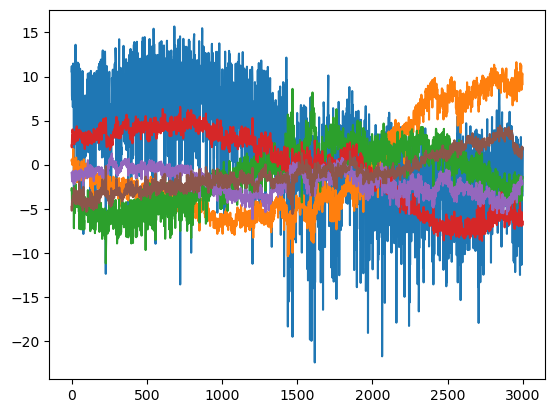

In [14]:
i = 32
marks = [trial_df["t_poke"].values[i]]
window = -1, 2

response = analysis.alligned_response(marks, window, pca=True)

plt.plot(response[0, :, :6])

## Response grouped by condition

In [18]:
trial_df.columns

Index(['nwb_file_name', 'epoch', 'trial_number_by_epoch', 'leaf', 'stem',
       'reward', 'contingency', 'date', 'session', 'rewscaled', 'stemchoice',
       'leafchoice', 'daynum', 'daysessionnum', 'stemswitch', 'n_post_switch',
       'n_pre_switch', 'cont_combo', 'Q1', 'Q2', 'Q3', 'Q4', 'Q5', 'Q6',
       'Qstem1', 'Qstem2', 'Qstem3', 'Qleaf1', 'Qleaf2', 'state_entropy',
       'reward_entropy', 'reward_entropy_leaf_1', 'reward_entropy_leaf_2',
       'reward_entropy_leaf_3', 'reward_entropy_leaf_4',
       'reward_entropy_leaf_5', 'reward_entropy_leaf_6',
       'reward_entropy_current_leaf', 'reward_entropy_pair_prev_leaf',
       'reward_entropy_pair_current_leaf', 'stem_1_p', 'stem_2_p', 'stem_3_p',
       'stem_stay_p', 'stem_go_turn_p', 'stem_turn_alone_p', 'leaf_1_p',
       'leaf_2_p', 'stem_1_var', 'stem_2_var', 'stem_3_var', 'stem_stay_var',
       'stem_go_turn_var', 'stem_turn_alone_var', 'leaf_1_var', 'leaf_2_var',
       'stem_choice_p', 'leaf_choice_p', 'stem_choice_

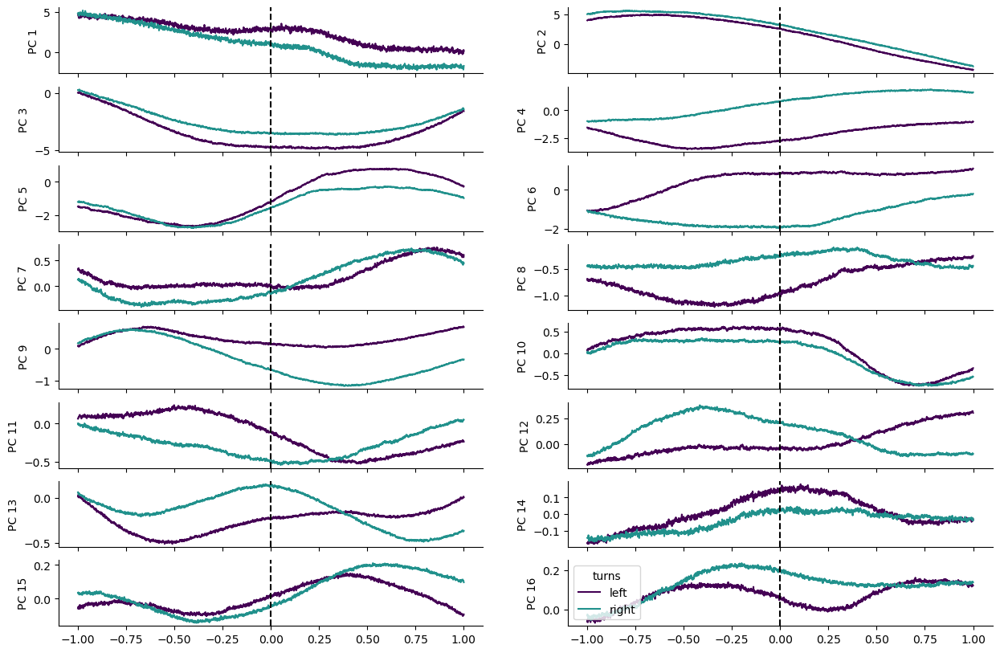

In [ ]:
mark_feature = "t_out"
window = (-0.25, 3)

mark_feature = "t_poke"
window = (-3, 0.5)

mark_feature = "run_start"
window = (-0.25, 3)

mark_feature = "t_choice"
window = (-1, 1)

# -----------------------
group_feature = "reward"
feature_bins = None

group_feature = "prev_trial_reward"
feature_bins = None

group_feature = "stem_choice_p"
feature_bins = np.linspace(0, 1, 11).round(2)
exclude_labels = ["start"]

group_feature = "Q_trial"
feature_bins = np.linspace(0, 0.8, 10).round(2)
feature_bins = np.percentile(trial_df["Q_trial"].values, np.linspace(0, 100, 5)).round(
    2
)

group_feature = "Q_stem_trial"
feature_bins = np.linspace(0, 0.8, 8).round(2)
feature_bins = np.percentile(
    trial_df["Q_stem_trial"].values, np.linspace(10, 99, 10)
).round(2)

group_feature = "turns"
feature_bins = None

# group_feature = "n_pre_switch"
# feature_bins = np.arange(5) + 0.1

# ------------------------
exclude_feature = "n_pre_switch"
exclude_feature_values = [-1]


# ------------------------
if exclude_feature is None:
    exclude_mask = np.zeros(len(trial_df), dtype=bool)
else:
    val = trial_df[exclude_feature].values
    exclude_mask = np.isin(val, exclude_feature_values)

if feature_bins is None:
    feature_values = trial_df[group_feature].values
    feature_labels = np.unique(feature_values).tolist()
    feature_labels = [
        label
        for label in feature_labels
        if (isinstance(label, str)) or not np.isnan(label)
    ]
    feature_labels = [label for label in feature_labels if label not in exclude_labels]
    category_inds = [feature_values == val for val in feature_labels]

else:
    feature_values = trial_df[group_feature].values
    category_inds = []
    feature_labels = []
    for lo, hi in zip(feature_bins[:-1], feature_bins[1:]):
        inds = (feature_values >= lo) & (feature_values <= hi)
        category_inds.append(inds)
        feature_labels.append(f"{lo}-{hi}")
# ---


fig, ax = plt.subplots(
    min(8, analysis.context_dim // 2), ncols=2, figsize=(15, 10), sharex=True
)
ax = ax.flatten()

for i_cat, (inds, label) in enumerate(zip(category_inds, feature_labels)):
    if inds.sum() == 0:
        continue
    marks = trial_df[mark_feature].values[np.logical_and(inds, ~exclude_mask)]

    response = analysis.alligned_response(marks, window, pca=True)
    mean_response = np.nanmean(response, axis=0)
    color = plt.cm.viridis(i_cat / len(category_inds))
    t_plot = np.linspace(
        window[0],
        window[1],
        mean_response.shape[0],
    )
    for i_dim, a in enumerate(ax):
        a.plot(t_plot, mean_response[:, i_dim], label=label, color=color)
        a.set_ylabel(f"PC {i_dim+1}")

for a in ax:
    a.spines["top"].set_visible(False)
    a.spines["right"].set_visible(False)
    a.axvline(0, color="k", linestyle="--")
ax[-1].legend(title=group_feature)

# Two-factor grouping

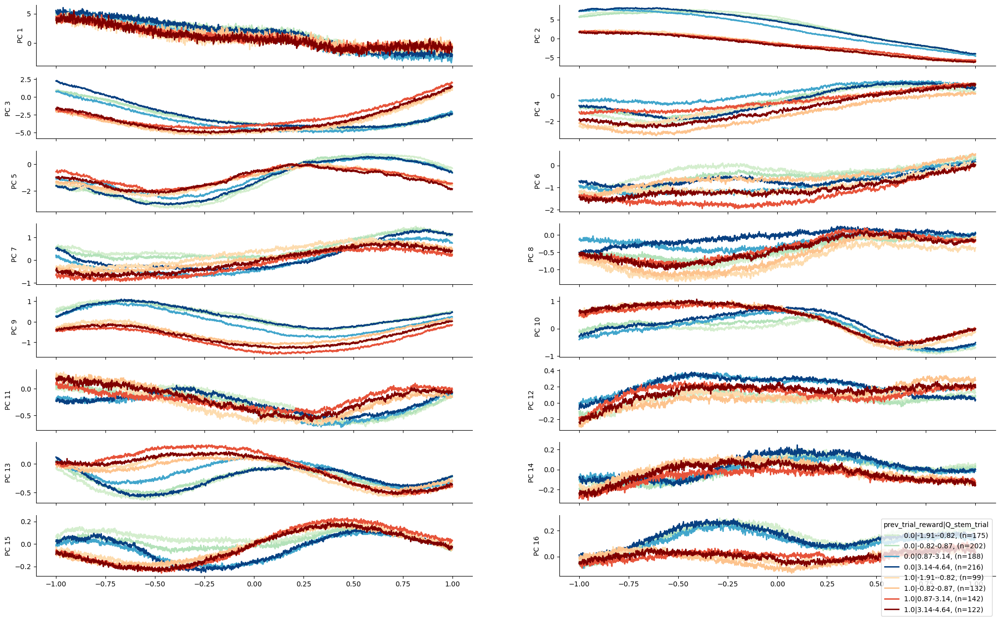

In [234]:
mark_feature = "t_out"
window = (-0.25, 1.5)


mark_feature = "t_poke"
window = (-1, 1)

# mark_feature = "run_start"
# window = (-0.25, 3)

mark_feature = "t_choice"
window = (-1, 1)

# -----------------------
group_feature = "reward"
feature_bins = None

group_feature = "prev_trial_reward"
feature_bins = None

# group_feature = "stem_choice_p"
# feature_bins = np.linspace(0, 1, 11).round(2)
# exclude_labels = ["start"]

group_feature = "Q_trial"
feature_bins = np.linspace(0, 0.5, 6).round(2)
feature_bins = np.array([0, 0.33, 1])
feature_bins = np.percentile(trial_df["Q_trial"].values, np.linspace(0, 100, 5)).round(
    2
)

group_feature = "Q_stem_trial"
feature_bins = np.linspace(0, 0.8, 8).round(2)
feature_bins = np.percentile(
    trial_df["Q_stem_trial"].values, np.linspace(10, 99, 5)
).round(2)

# exclude_labels = []
# exclude = None

# ----------------------
group_feature_2 = "reward"
feature_bins_2 = None

group_feature_2 = "prev_trial_reward"
feature_bins_2 = None
exclude_labels_2 = []
exclude_2 = None

# group_feature="turns"
# feature_bins=None

# group_feature = "n_pre_switch"
# feature_bins = np.arange(5) + 0.1

# ------------------------
exclude_feature = "n_pre_switch"
exclude_feature_values = [0]


# -------------------------
if exclude_feature is None:
    exclude_mask = np.zeros(len(trial_df), dtype=bool)
else:
    val = trial_df[exclude_feature].values
    exclude_mask = np.isin(val, exclude_feature_values)


if feature_bins is None:
    feature_values = trial_df[group_feature].values
    feature_labels = np.unique(feature_values).tolist()
    feature_labels = [
        label
        for label in feature_labels
        if (isinstance(label, str)) or not np.isnan(label)
    ]
    feature_labels = [label for label in feature_labels if label not in exclude_labels]
    category_inds = [feature_values == val for val in feature_labels]

else:
    feature_values = trial_df[group_feature].values
    category_inds = []
    feature_labels = []
    for lo, hi in zip(feature_bins[:-1], feature_bins[1:]):
        inds = (feature_values >= lo) & (feature_values <= hi)
        if exclude is not None:
            inds = np.logical_and(inds, feature_values != exclude)
        category_inds.append(inds)
        feature_labels.append(f"{lo}-{hi}")

if feature_bins_2 is None:
    feature_values_2 = trial_df[group_feature_2].values
    feature_labels_2 = np.unique(feature_values_2).tolist()
    feature_labels_2 = [
        label
        for label in feature_labels_2
        if (isinstance(label, str)) or not np.isnan(label)
    ]
    feature_labels_2 = [
        label for label in feature_labels_2 if label not in exclude_labels_2
    ]
    category_inds_2 = [feature_values_2 == val for val in feature_labels_2]
else:
    feature_values_2 = trial_df[group_feature_2].values
    category_inds_2 = []
    feature_labels_2 = []
    for lo, hi in zip(feature_bins_2[:-1], feature_bins_2[1:]):
        inds = (feature_values_2 >= lo) & (feature_values_2 <= hi)
        category_inds_2.append(inds)
        feature_labels_2.append(f"{lo}-{hi}")

# ---

fig, ax = plt.subplots(
    min(8, analysis.context_dim // 2), ncols=2, figsize=(25, 15), sharex=True
)
ax = ax.flatten()

cmaps = [plt.cm.GnBu, plt.cm.OrRd]


for i_cat_2, (inds_2, label_2) in enumerate(zip(category_inds_2, feature_labels_2)):
    if inds_2.sum() == 0:
        continue
    cmap = cmaps[i_cat_2]

    for i_cat, (inds, label) in enumerate(zip(category_inds, feature_labels)):
        if inds.sum() == 0:
            continue
        marks = trial_df[mark_feature].values[
            np.logical_and(np.logical_and(inds, inds_2), ~exclude_mask)
        ]
        marks = marks[~np.isnan(marks)]
        if len(marks) == 0:
            continue
        response = analysis.alligned_response(marks, window, pca=True)
        mean_response = np.nanmean(response, axis=0)
        c_val = i_cat / (len(category_inds) - 1)
        c_val = max(c_val, 0.2)
        color = cmap(c_val)
        t_plot = np.linspace(
            window[0],
            window[1],
            mean_response.shape[0],
        )
        plot_label = f"{label_2}|{label}, (n={marks.shape[0]})"
        for i_dim, a in enumerate(ax):
            a.plot(t_plot, mean_response[:, i_dim], label=plot_label, color=color, lw=2)
            a.set_ylabel(f"PC {i_dim+1}")

for a in ax:
    a.spines["top"].set_visible(False)
    a.spines["right"].set_visible(False)
ax[-1].legend(title=f"{group_feature_2}|{group_feature}")

In [125]:
feature_bins

array([0.12187478, 0.15222952, 0.16667507, 0.17581857, 0.18724744,
       0.1954125 , 0.20237697, 0.20538478, 0.21278504, 0.21929615,
       0.24624283, 0.32211783, 0.32963745, 0.34833222, 0.3606072 ,
       0.36855695, 0.38112736, 0.39292288, 0.42356043, 0.44485303,
       0.46835826, 0.48098408, 0.49570493, 0.50457226, 0.52357658])

## Theta-frequency power of context feature over time

In [236]:
from spyglass.common import FirFilterParameters

data = analysis.c_pca_interp[::1]
t_data = analysis.t_interp[::1]
np.mean(np.diff(t_data))


filter_query = FirFilterParameters() & {
    "filter_sampling_rate": 1000,
    "filter_name": "Theta 5-11 Hz",
}
filter_ = (filter_query).fetch(as_dict=True)
filter_coeff = filter_[0]["filter_coeff"]

f, t_f = FirFilterParameters().filter_data(
    t_data,
    data,
    filter_coeff,
    [[t_data[0], t_data[-1]]],
    np.arange(context_dim),
    1,
)

ind = ~np.isnan(f).any(axis=1)
f = f[ind]
t_f = t_f[ind]

In [237]:
import pandas as pd
from scipy.signal import hilbert

analytic_signal_df = pd.DataFrame(
    hilbert(f, axis=0),
    index=pd.Index(t_f, name="time"),
    # columns=[f"electrode {e}" for e in electrode_list],
)
phase_df = pd.DataFrame(
    np.angle(analytic_signal_df) + np.pi,
    columns=analytic_signal_df.columns,
    index=analytic_signal_df.index,
)
power_df = pd.DataFrame(
    np.abs(analytic_signal_df) ** 2,
    columns=analytic_signal_df.columns,
    index=analytic_signal_df.index,
)

Text(0.5, 0.98, 'Context theta band power')

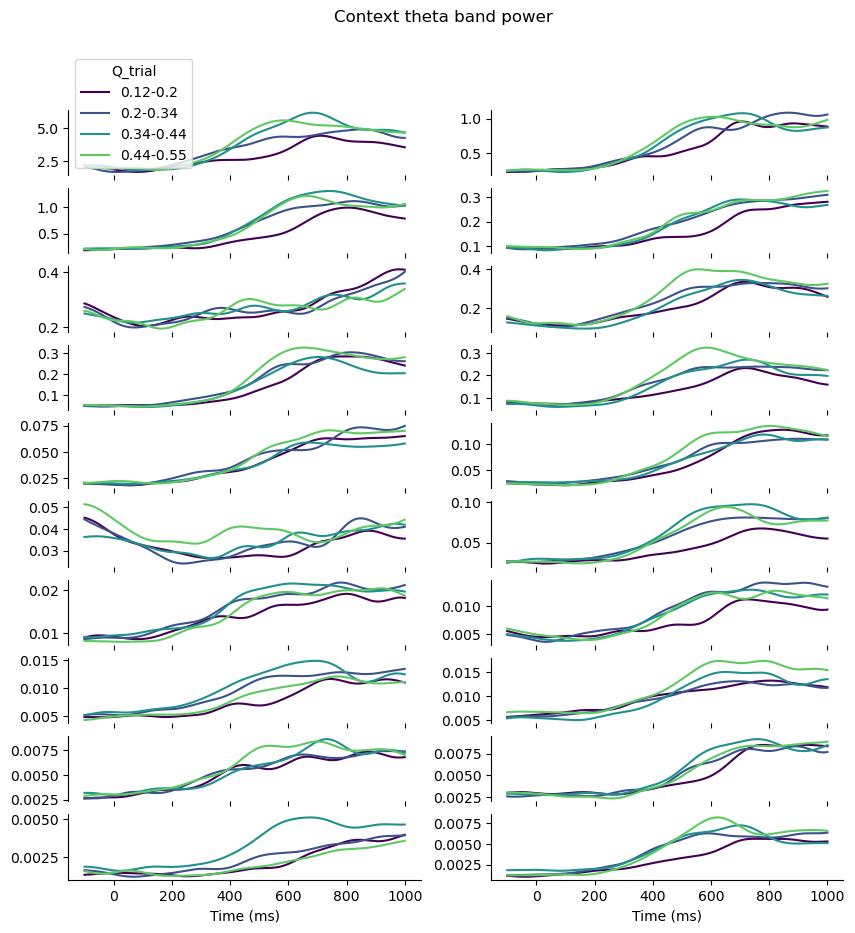

In [ ]:
from src.c3po.analysis.analysis import bootstrap_traces

offset = 0
mark_feature = "t_poke"
window = (-0.1, 1)


group_feature = "n_pre_switch"
feature_bins = None
feature_bins = np.arange(5)

group_feature = "reward"
feature_bins = None

group_feature = "Q_trial"
feature_bins = np.percentile(trial_df["Q_trial"].values, np.linspace(0, 100, 5)).round(
    2
)

plot_examples = 0
#########################################################################


# marks_ind = slice(offset, None) if offset >= 0 else slice(None, offset)
# # feature_ind = slice(None, -offset) if offset > 0 else slice(-offset, None)
# marks = marks[marks_ind]

# marks = trial_df[mark_feature].values


# response = analysis.alligned_response(
#     marks,
#     window,
#     passed_data=(power_df.values, power_df.index),
# )
# t_plot = np.linspace(*window, response.shape[1]) * 1000


# ---------------------------------------------------------------------------'
# Single feature analysis
fig, ax = plt.subplots(nrows=context_dim // 2, ncols=2, sharex=True, figsize=(10, 10))
ax = np.ravel(ax)
subset_behav = all_behav.iloc[feature_ind]

# unique_vals = (
#     subset_behav[group_feature_name].unique() if feature_bins is None else feature_bins
# )

if feature_bins is None:
    feature_values = trial_df[group_feature].values
    feature_labels = np.unique(feature_values).tolist()
    feature_labels = [
        label
        for label in feature_labels
        if (isinstance(label, str)) or not np.isnan(label)
    ]
    feature_labels = [label for label in feature_labels if label not in exclude_labels]
    category_inds = [feature_values == val for val in feature_labels]

else:
    feature_values = trial_df[group_feature].values
    category_inds = []
    feature_labels = []
    for lo, hi in zip(feature_bins[:-1], feature_bins[1:]):
        inds = (feature_values >= lo) & (feature_values <= hi)
        category_inds.append(inds)
        feature_labels.append(f"{lo}-{hi}")


for i, (ind, val) in enumerate(zip(category_inds, feature_labels)):
    color = plt.cm.viridis(i / len(category_inds))
    # ind = trial_df[group_feature_name] == val
    marks = trial_df[mark_feature].values[ind]
    response = analysis.alligned_response(
        marks,
        window,
        passed_data=(power_df.values, power_df.index),
    )
    t_plot = np.linspace(*window, response.shape[1]) * 1000

    for i, a in enumerate(ax):
        data_i = response[..., i]
        # yy, rng = bootstrap_traces(data_i, n_boot=100)
        # a.fill_between(
        #     t_plot,
        #     *rng,
        #     alpha=0.3,
        #     facecolor=color,
        # )
        yy = data_i.mean(axis=0)
        a.plot(t_plot, yy, label=val, color=color)

        # a.plot(t_plot, data_i.mean(axis=0), label=val, color=color)
        a.spines[["top", "right", "bottom"]].set_visible(False)

for a in [ax[-1], ax[-2]]:
    a.set_xlabel("Time (ms)")
    a.spines["bottom"].set_visible(True)
ax[0].legend(title=group_feature_name)
fig.suptitle("Context theta band power")

# plt.plot(t_plot, response.mean(axis=0))
# plt.xlim(-500,500)

In [255]:
[c.sum() for c in category_inds]

[0, 0, 0, 1]

## Spiking response to context phase

In [259]:
from spyglass.common import interval_list_contains, interval_list_contains_ind

s = spikes[0]
bins = np.linspace(0, 2 * np.pi, 100)
# center = np.array(t_out)[all_behav["reward"].values == 1][:]
window = (0, 0.5)

# center = np.array(t_poke)[all_behav["reward"].values == 1]
# window = (.2,.5)

t_data = phase_df.index
data = phase_df.values

# center  = trial_df.t_poke.values
# test_intervals = np.array([(c + window[0], c + window[1]) for c in center])
# test_intervals = test_intervals[trial_df["reward"].values == 1]

# ceter = l_df.t_poke.values
# test_intervals = np.array([(c + window[0], c + window[1]) for c in center])
# test_intervals = test_intervals[trial_df["reward"].values == 1]

test_intervals = np.array(
    [trial_df["t_poke"].values[:-1], trial_df["t_out"].values[1:]]
).T
test_intervals = [
    t for i, t in enumerate(test_intervals) if trial_df["reward"].values[i] == 1
]
test_intervals = [t for t in test_intervals if t[1] - t[0] > 0 and t[1] - t[0] < 60]
test_intervals = np.array(test_intervals)

# test_intervals = np.array([t_poke, t_out]).T
# test_intervals = test_intervals[all_behav["reward"].values == 0]


ind_data = interval_list_contains_ind(test_intervals, t_data)
counts = np.array(
    [np.histogram(data[ind_data, i], bins=bins)[0] for i in range(data.shape[1])]
).T
phase_densities = []
for s_full in spikes:
    s = interval_list_contains(test_intervals, s_full)
    # if len(s) < 100:
    #     continue

    data_s = data[np.digitize(s, t_data), :]
    h = np.array(
        [np.histogram(data_s[:, i_c], bins=bins)[0] for i_c in range(data.shape[1])]
    ).T
    # h = h / h.sum(axis=0)
    h = h / counts
    phase_densities.append(h)
phase_densities = np.array(phase_densities)

[15:16:14][WARNING] Spyglass: DEPRECATION scheduled for Spyglass 0.6.0: interval_list_contains_ind
	Use Interval.contains instead
[15:16:14][WARNING] Spyglass: Found overlap(s). Use no_overlap flag to consolidate or not: [1.61755444e+09, 1.61755445e+09] [1.61755445e+09, 1.61755447e+09] [1.61755448e+09, 1.61755450e+09] [1.61755452e+09, 1.61755454e+09] [1.61755453e+09, 1.61755455e+09] [1.61755454e+09, 1.61755456e+09] [1.61755455e+09, 1.61755456e+09] [1.61755458e+09, 1.61755459e+09] [1.61755459e+09, 1.61755461e+09] [1.61755460e+09, 1.61755461e+09] [1.61755462e+09, 1.61755463e+09] [1.61755462e+09, 1.61755463e+09] [1.61755464e+09, 1.61755465e+09] [1.61755467e+09, 1.61755468e+09] [1.61755473e+09, 1.61755475e+09] [1.61755476e+09, 1.61755477e+09] [1.61755478e+09, 1.61755479e+09] [1.61755480e+09, 1.61755482e+09] [1.61755481e+09, 1.61755482e+09] [1.61755482e+09, 1.61755483e+09] [1.61755484e+09, 1.61755485e+09] [1.61755484e+09, 1.61755485e+09] [1.61755488e+09, 1.61755490e+09] [1.61755493e+09, 1.6

In [204]:
[t[1] - t[0] for t in test_intervals]

[17.115999937057495,
 20.919000148773193,
 15.942999839782715,
 17.497999906539917,
 16.536999940872192,
 13.930000066757202,
 8.052000045776367,
 9.907000064849854,
 14.080000162124634,
 7.949000120162964,
 13.303000211715698,
 8.978000164031982,
 10.077000141143799,
 10.794000148773193,
 10.976999998092651,
 11.25,
 10.758000135421753,
 14.35700011253357,
 9.004999876022339,
 9.972000122070312,
 14.868000030517578,
 10.936000108718872,
 10.943000078201294,
 12.506999969482422,
 15.468999862670898,
 10.07200002670288,
 8.41700005531311,
 8.07699990272522,
 12.871000051498413,
 8.814000129699707,
 13.54800009727478,
 9.043999910354614,
 13.28000020980835,
 15.14300012588501,
 9.655999898910522,
 13.55400013923645,
 9.231000185012817,
 9.426000118255615,
 15.449000120162964,
 9.859999895095825,
 10.196999788284302,
 14.037999868392944,
 9.16100001335144,
 9.147000074386597,
 9.36900019645691,
 9.494999885559082,
 9.220999956130981,
 8.85699987411499,
 8.799999952316284,
 8.6670000553131

[15:17:46][WARNING] Spyglass: DEPRECATION scheduled for Spyglass 0.6.0: interval_list_contains
	Use Interval.contains instead
[15:17:46][WARNING] Spyglass: Found overlap(s). Use no_overlap flag to consolidate or not: [1.61755444e+09, 1.61755445e+09] [1.61755445e+09, 1.61755447e+09] [1.61755448e+09, 1.61755450e+09] [1.61755452e+09, 1.61755454e+09] [1.61755453e+09, 1.61755455e+09] [1.61755454e+09, 1.61755456e+09] [1.61755455e+09, 1.61755456e+09] [1.61755458e+09, 1.61755459e+09] [1.61755459e+09, 1.61755461e+09] [1.61755460e+09, 1.61755461e+09] [1.61755462e+09, 1.61755463e+09] [1.61755462e+09, 1.61755463e+09] [1.61755464e+09, 1.61755465e+09] [1.61755467e+09, 1.61755468e+09] [1.61755473e+09, 1.61755475e+09] [1.61755476e+09, 1.61755477e+09] [1.61755478e+09, 1.61755479e+09] [1.61755480e+09, 1.61755482e+09] [1.61755481e+09, 1.61755482e+09] [1.61755482e+09, 1.61755483e+09] [1.61755484e+09, 1.61755485e+09] [1.61755484e+09, 1.61755485e+09] [1.61755488e+09, 1.61755490e+09] [1.61755493e+09, 1.61755

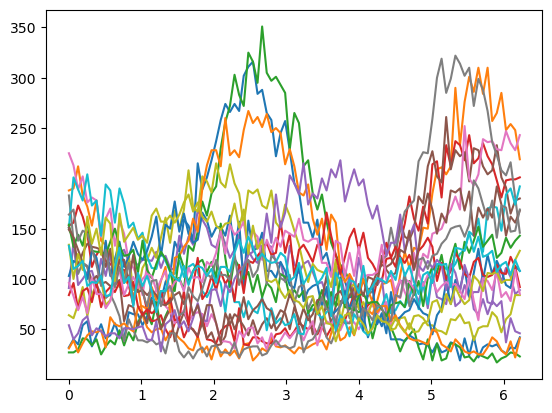

In [260]:
all_poke_intervals[:, 0]
p = interval_list_contains(test_intervals, all_poke_intervals[:, 0])

data_p = data[np.digitize(p, t_data), :]
h = np.array(
    [np.histogram(data_p[:, i_c], bins=bins)[0] for i_c in range(data.shape[1])]
).T
# h = h / h.sum(axis=0)
poke_density = h / counts


plt.plot(bins[:-1], h)

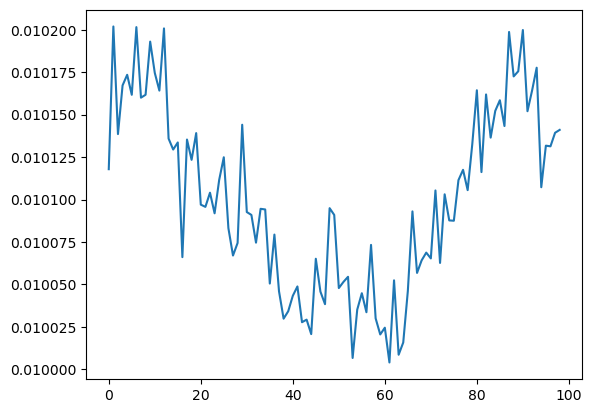

In [261]:
from spyglass.common import interval_list_contains_ind

# ind_data = interval_list_contains_ind(test_intervals, t_data)

counts = np.array(
    [np.histogram(data[ind_data, 0], bins=bins)[0] for i in range(data.shape[1])]
).T
h.shape, counts.shape
c_i = counts[:, i]
c_i = c_i / np.sum(c_i)
plt.plot(c_i)

[15:17:59][WARNING] Spyglass: DEPRECATION scheduled for Spyglass 0.6.0: interval_list_contains
	Use Interval.contains instead


[15:17:59][WARNING] Spyglass: Found overlap(s). Use no_overlap flag to consolidate or not: [1.61755444e+09, 1.61755445e+09] [1.61755445e+09, 1.61755447e+09] [1.61755448e+09, 1.61755450e+09] [1.61755452e+09, 1.61755454e+09] [1.61755453e+09, 1.61755455e+09] [1.61755454e+09, 1.61755456e+09] [1.61755455e+09, 1.61755456e+09] [1.61755458e+09, 1.61755459e+09] [1.61755459e+09, 1.61755461e+09] [1.61755460e+09, 1.61755461e+09] [1.61755462e+09, 1.61755463e+09] [1.61755462e+09, 1.61755463e+09] [1.61755464e+09, 1.61755465e+09] [1.61755467e+09, 1.61755468e+09] [1.61755473e+09, 1.61755475e+09] [1.61755476e+09, 1.61755477e+09] [1.61755478e+09, 1.61755479e+09] [1.61755480e+09, 1.61755482e+09] [1.61755481e+09, 1.61755482e+09] [1.61755482e+09, 1.61755483e+09] [1.61755484e+09, 1.61755485e+09] [1.61755484e+09, 1.61755485e+09] [1.61755488e+09, 1.61755490e+09] [1.61755493e+09, 1.61755494e+09] [1.61755497e+09, 1.61755498e+09] [1.61755499e+09, 1.61755500e+09] [1.61755500e+09, 1.61755501e+09] [1.61755503e+09, 1

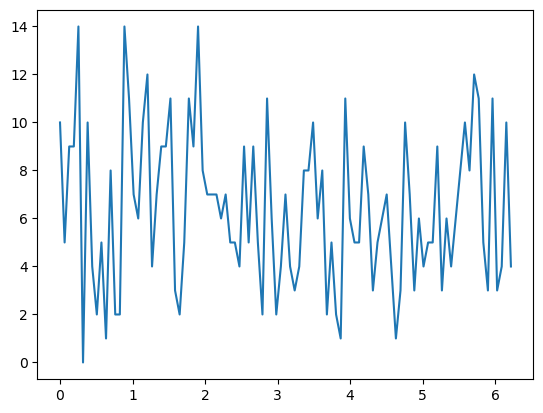

In [262]:
p = interval_list_contains(test_intervals, run_ripp_df["start_time"].values)

data_p = data[np.digitize(p, t_data), :]
h = np.array(
    [np.histogram(data_p[:, i_c], bins=bins)[0] for i_c in range(data.shape[1])]
).T
# h = h / h.sum(axis=0)
ripple_density = h / counts


plt.plot(bins[:-1], h[:, 0])

In [263]:
def smooth(x, window_len=11, window="hamming"):
    if x.ndim != 1:
        raise ValueError("smooth only accepts 1 dimension arrays.")
    if x.size < window_len:
        raise ValueError("Input vector needs to be bigger than window size.")
    if window_len < 3:
        return x
    if window == "hanning":
        w = np.hanning(window_len)
    elif window == "hamming":
        w = np.hamming(window_len)
    elif window == "blackman":
        w = np.blackman(window_len)
    elif window == "gaussian":
        w = np.hanning(window_len)
        w = np.exp(
            -0.5
            * (np.arange(window_len) - window_len // 2) ** 2
            / (window_len // 6) ** 2
        )
        w /= w.sum()
    else:
        raise ValueError("Window is on of 'hanning', 'hamming', 'blackman'")
    y = np.convolve(w / w.sum(), x, mode="valid")
    return y

In [264]:
poke_density.shape
vals.shape, phase_densities.shape, np.mean(vals, axis=1).shape

AxisError: axis 1 is out of bounds for array of dimension 1

Text(0, 0.5, 'Cell')

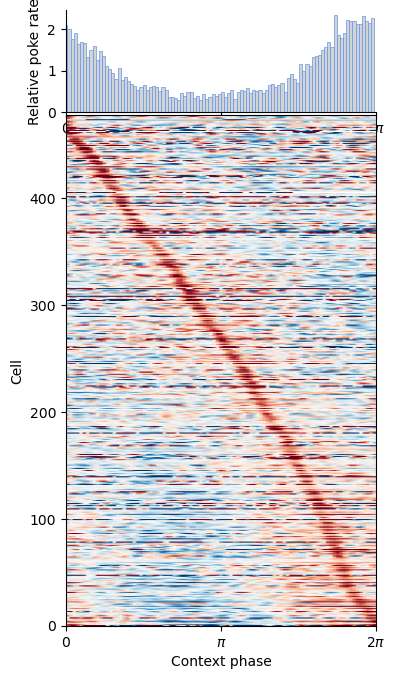

In [265]:
# fig,ax = plt.subplots(nrows=2,sharex=True,height_ratios=[1,10])
import matplotlib.gridspec as gridspec

context_dim = 6
fig = plt.figure(figsize=(4, 8))  # Adjust figure size if needed
gs = gridspec.GridSpec(2, 1, height_ratios=[2, 10], hspace=0.01)
ax0 = plt.subplot(gs[0])
ax1 = plt.subplot(gs[1], sharex=ax0)

poke_val = poke_density[:, context_dim]
poke_val = poke_val / np.mean(poke_val)
# poke_val = np.log2(poke_val)
ax0.bar(
    bins[:-1],
    poke_val,
    facecolor="lightgrey",
    edgecolor="cornflowerblue",
    lw=0.5,
    width=np.diff(bins)[0],
)
ax0.set_xticks(
    [],
)
ax0.spines[
    [
        "top",
        "right",
    ]
].set_visible(False)
ax0.set_ylabel("Relative poke rate")

vals = phase_densities[:, :, context_dim]
vals = vals / np.mean(vals, axis=1)[:, None]
# vals = vals-(1/vals.shape[1])
# vals = vals / (1 / vals.shape[1])
# vals = np.concatenate([vals, vals], axis=1)
vals = np.array(
    [
        smooth(
            vals[i, :],
            7,
            # sigma=3,
        )
        for i in range(vals.shape[0])
    ]
)


vals = np.log2(vals)

ind_sort = np.argsort(np.argmin(vals, axis=1))


c_scale = 0.3
ax1.imshow(
    vals[ind_sort],
    aspect="auto",
    cmap="RdBu",
    clim=(-c_scale, c_scale),
    extent=[bins[0], bins[-1], 0, vals.shape[0]],
)
ax1.set_xticks([0, np.pi, 2 * np.pi], ["0", "$\pi$", "$2\pi$"])

ax1.set_xlabel("Context phase")
ax1.set_ylabel("Cell")
# plt.colorbar()
# plt.title("log2 firing rate/mean firing rate")

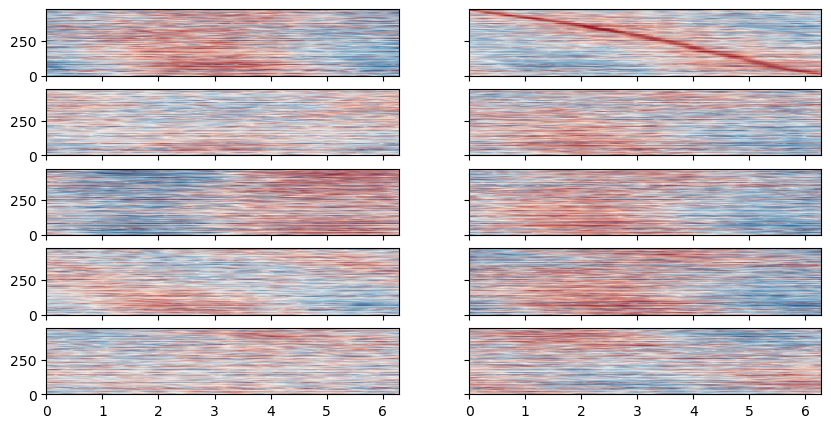

In [211]:
fig, ax = plt.subplots(5, 2, figsize=(10, 5), sharex=True, sharey=True)

for i, a in enumerate(ax.flatten()):
    vals = phase_densities[:, :, i]
    vals = vals / np.mean(vals, axis=1)[:, None]
    # vals = vals-(1/vals.shape[1])
    # vals = vals / (1 / vals.shape[1])
    vals = np.array(
        [
            smooth(
                vals[i, :],
                10,
            )
            for i in range(vals.shape[0])
        ]
    )

    vals = np.log2(vals)

    # ind_sort = np.argsort(np.argmax(vals, axis=1))

    c_scale = 0.2
    a.imshow(
        vals[ind_sort],
        aspect="auto",
        cmap="RdBu",
        clim=(-c_scale, c_scale),
        extent=[bins[0], bins[-1], 0, vals.shape[0]],
    )

# plt.xlabel("Context phase")
# plt.ylabel("Cell")
# plt.colorbar()
# plt.title("log2 firing rate/mean firing rate")

# Cross Correlograms


In [ ]:
# Intervals

# rewarded_lick_intervals
reward_trials_df = trial_df[trial_df["reward"] == 1]
rewarded_lick_intervals = np.array(
    [
        [max(row["t_poke"], row["t_out"] - 1), row["t_out"]]
        for _, row in reward_trials_df.iterrows()
    ]
)

In [ ]:
lags, xcorr = analysis.cross_correlation(
    pca=True,
    intervals=rewarded_lick_intervals,
    processes=16,
    dim_limit=6,
    max_lag_seconds=0.5,
)

/home/sambray/mambaforge-pypy3/envs/spyglass2025/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
100%|██████████| 36/36 [01:29<00:00,  2.48s/it]


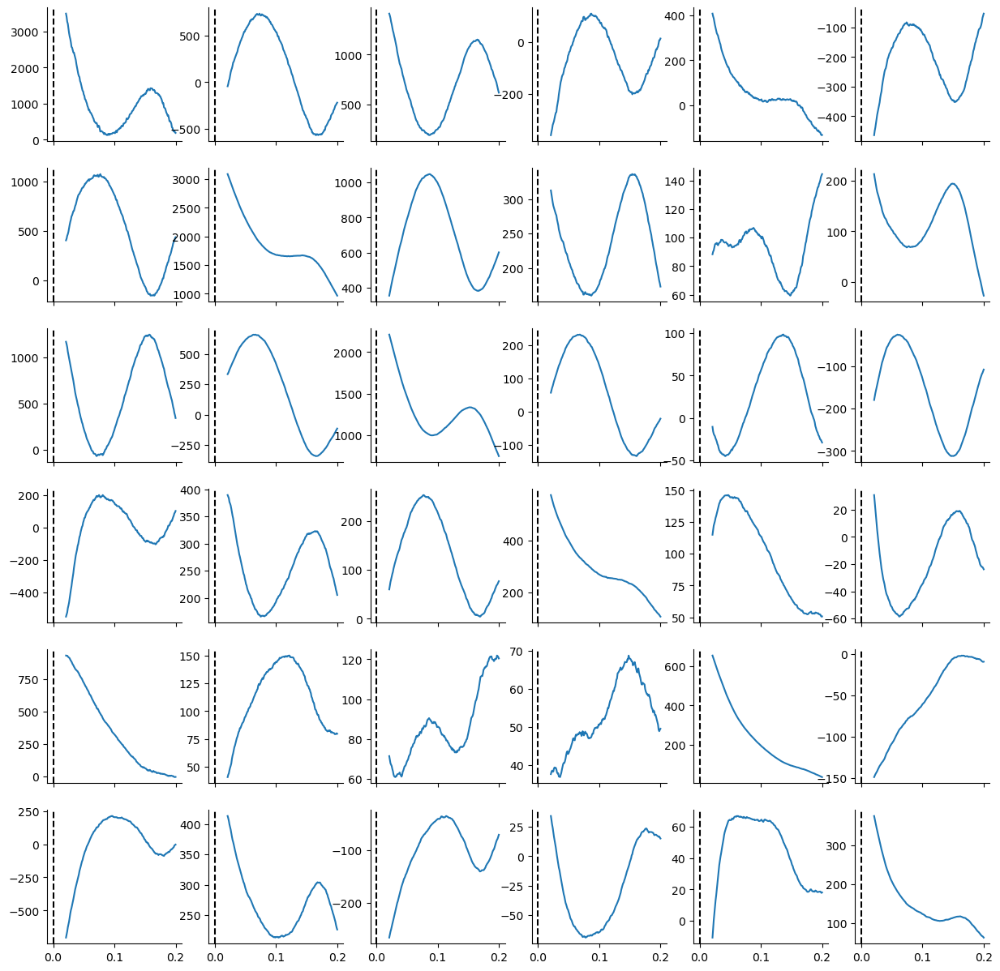

: 

In [ ]:
n = 6

tlim = 0.2
tlim = 0.02, 0.2


if not isinstance(tlim, tuple):
    tlim = (-tlim, tlim)


import matplotlib.pyplot as plt

fig, ax = plt.subplots(n, n, figsize=(15, 15), sharex=True)
ind = np.where((lags > tlim[0]) & (lags < tlim[1]) & (np.abs(lags) > 0.01))[0]
for i in range(n):
    for j in range(n):
        ax[i, j].plot(lags[ind], xcorr[i, j, ind])

for a in ax.flatten():
    a.spines["top"].set_visible(False)
    a.spines["right"].set_visible(False)
    a.axvline(0, color="k", linestyle="--")

# Lick response curves

In [ ]:
poke_in_times = np.array(all_poke_intervals[:, 0])
window = -0.1, 0.5
response = analysis.alligned_response(poke_in_times, window, pca=True)

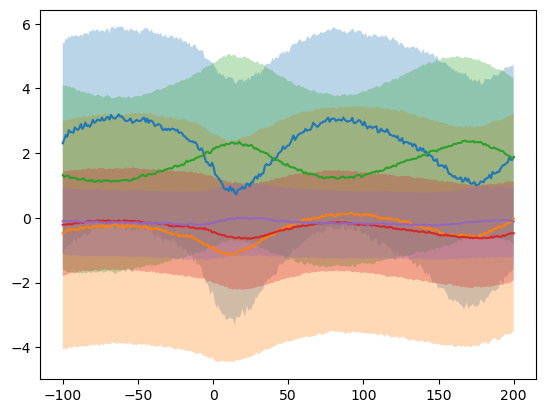

In [ ]:
mid = np.median(response, axis=0)
lo = np.percentile(response, 25, axis=0)
hi = np.percentile(response, 75, axis=0)

t_plot = np.linspace(window[0], window[1], response.shape[1]) * 1000
for i in range(5):
    plt.fill_between(
        t_plot,
        lo[:, i],
        hi[:, i],
        alpha=0.3,
    )
    plt.plot(t_plot, mid[:, i])

In [ ]:
reward_trial_inds = np.where(trial_df["reward"].values == 1)[0]
reward_interval_starts = trial_df["t_poke"].values[reward_trial_inds]
reward_interval_ends = trial_df["t_out"].values[reward_trial_inds + 1]
reward_intervals = np.array(list(zip(reward_interval_starts, reward_interval_ends)))
reward_intervals.shape

unrewarded_trial_inds = np.where(trial_df["reward"].values == 0)[0][:-1]
unrewarded_interval_starts = trial_df["t_poke"].values[unrewarded_trial_inds]
unrewarded_interval_ends = trial_df["t_out"].values[unrewarded_trial_inds + 1]
unrewarded_intervals = np.array(
    list(zip(unrewarded_interval_starts, unrewarded_interval_ends))
)
unrewarded_intervals.shape

(990, 2)

In [ ]:
rewarded_poke_times = interval_list_contains(reward_intervals, all_poke_intervals[:, 0])
unrewarded_poke_times = interval_list_contains(
    unrewarded_intervals, all_poke_intervals[:, 0]
)

[11:46:45][WARNING] Spyglass: DEPRECATION scheduled for Spyglass 0.6.0: interval_list_contains
	Use Interval.contains instead
[11:46:46][WARNING] Spyglass: Found overlap(s). Use no_overlap flag to consolidate or not: [1.61755444e+09, 1.61755445e+09] [1.61755445e+09, 1.61755447e+09] [1.61755448e+09, 1.61755450e+09] [1.61755452e+09, 1.61755454e+09] [1.61755453e+09, 1.61755455e+09] [1.61755454e+09, 1.61755456e+09] [1.61755455e+09, 1.61755456e+09] [1.61755458e+09, 1.61755459e+09] [1.61755459e+09, 1.61755461e+09] [1.61755460e+09, 1.61755461e+09] [1.61755462e+09, 1.61755463e+09] [1.61755462e+09, 1.61755463e+09] [1.61755464e+09, 1.61755465e+09] [1.61755467e+09, 1.61755468e+09] [1.61755473e+09, 1.61755475e+09] [1.61755476e+09, 1.61755477e+09] [1.61755478e+09, 1.61755479e+09] [1.61755480e+09, 1.61755482e+09] [1.61755481e+09, 1.61755482e+09] [1.61755482e+09, 1.61755483e+09] [1.61755484e+09, 1.61755485e+09] [1.61755484e+09, 1.61755485e+09] [1.61755488e+09, 1.61755490e+09] [1.61755493e+09, 1.61755

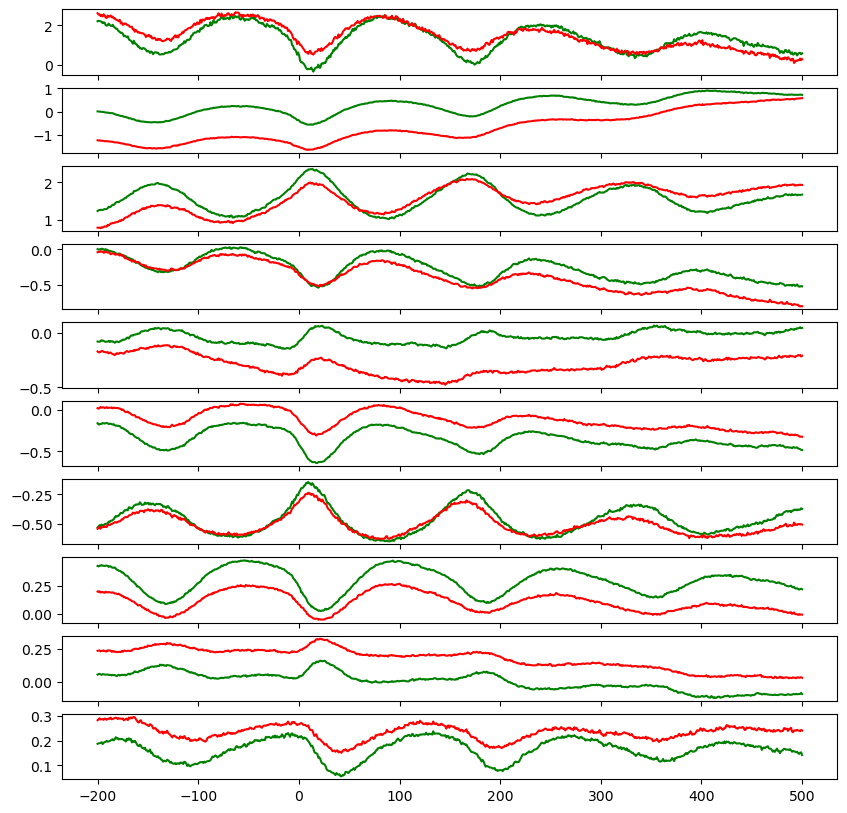

In [172]:
window = (-0.2, 0.5)
rewarded_response = analysis.alligned_response(rewarded_poke_times, window, pca=True)
unrewarded_response = analysis.alligned_response(
    unrewarded_poke_times, window, pca=True
)

t_plot = np.linspace(window[0], window[1], rewarded_response.shape[1]) * 1000
fig, ax = plt.subplots(
    10,
    figsize=(10, 10),
    sharex=True,
)
for i in range(ax.size):
    ax[i].plot(t_plot, rewarded_response[:, :, i].mean(axis=0), color="green")
    ax[i].plot(t_plot, unrewarded_response[:, :, i].mean(axis=0), color="red")

# Ripple Response curves

141


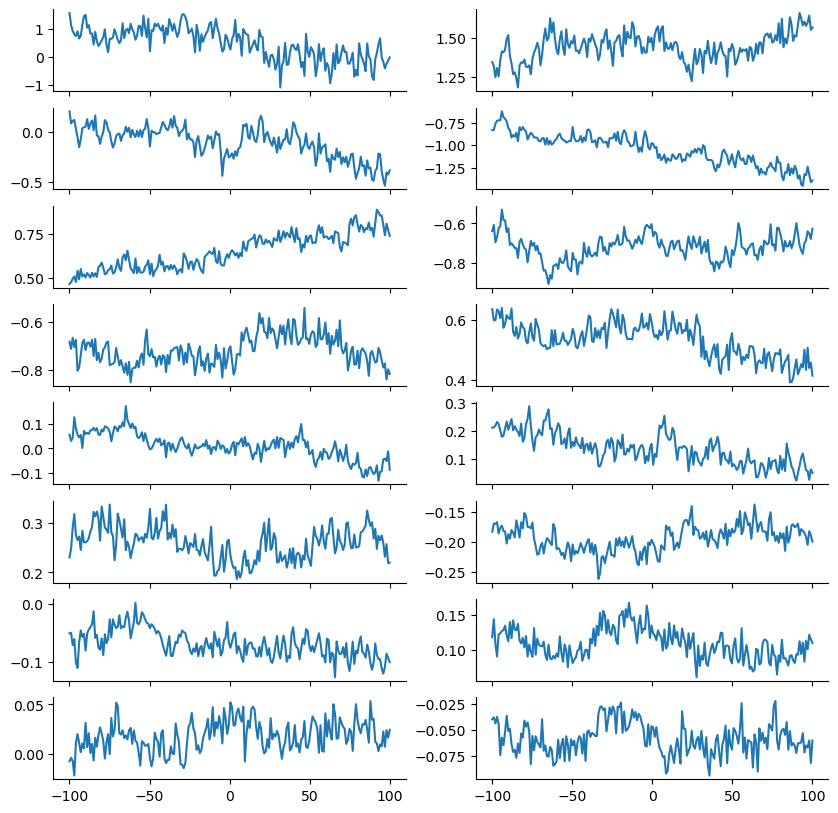

In [ ]:
marks = run_ripp_df.start_time.values
len_ripple = run_ripp_df.end_time.values - run_ripp_df.start_time.values
marks = marks[len_ripple > 0.1]
print(marks.size)
window = -0.1, 0.1
response = analysis.alligned_response(marks, window, pca=True)

t_plot = np.linspace(window[0], window[1], response.shape[1]) * 1000
fig, ax = plt.subplots(8, 2, figsize=(10, 10), sharex=True)
ax = ax.flatten()
for i, a in enumerate(ax):
    a.plot(t_plot, response.mean(axis=0)[:, i])
    a.spines[["top", "right"]].set_visible(False)